# FreqNet: Deepfake Detection using Frequency Domain Learning

## Key Improvements:
- **Proper Complex Frequency Convolution**: Real/imaginary mixing (not independent convs)
- **Multi-scale HFRI**: High-Frequency Representation of Image at multiple scales
- **Magnitude-based HFRI**: More stable than discarding imaginary part + ReLU
- **Clean Residual Backbone**: With FrequencyConvLayer integration



## 1. Import Libraries and Setup


In [ ]:
import os
import io
import random
import math
import platform
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Subset
import torchvision.transforms as T
import torchvision.datasets as datasets

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    average_precision_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    precision_recall_curve
)

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

if platform.system() == 'Windows':
    print("Windows detected: Using num_workers=0 for DataLoader compatibility")
    DEFAULT_NUM_WORKERS = 0
else:
    DEFAULT_NUM_WORKERS = 4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
    
    torch.cuda.empty_cache()
    import os
    os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'
    print("CUDA memory management configured")

def clear_memory():
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.synchronize()


Windows detected: Using num_workers=0 for DataLoader compatibility
Using device: cuda
GPU: NVIDIA GeForce RTX 3060 Ti
Memory: 8.59 GB
CUDA memory management configured


## 2. Configuration


In [ ]:

class Config:
    dataset_path = './Dataset'
    train_path = os.path.join(dataset_path, 'Train')
    val_path = os.path.join(dataset_path, 'Validation')
    test_path = os.path.join(dataset_path, 'Test')
    
    train_real = 9000
    train_fake = 9000
    val_real = 3900
    val_fake = 3900
    test_real = 3200
    test_fake = 3200
    
    batch_size = 16 
    num_epochs = 20
    learning_rate = 1e-3
    weight_decay = 1e-4
    

    load_size = 256
    crop_size = 224
    
    scales = (4, 8)  
    base_ch = 64  
    dropout = 0.3 
    
    save_dir = './checkpoints'
    seed = 42
    use_jpeg_aug = False  
    
    def __init__(self):
        if platform.system() == 'Windows':
            self.num_workers = 0
        else:
            self.num_workers = 4
    
config = Config()
os.makedirs(config.save_dir, exist_ok=True)
print("Configuration loaded successfully!")
print(f"DataLoader num_workers: {config.num_workers} ({'Windows compatibility' if config.num_workers == 0 else 'Multi-process loading'})")


Configuration loaded successfully!
DataLoader num_workers: 0 (Windows compatibility)


## 3. Data Utilities and Transforms (with Robustness Augmentations)


In [3]:
class RandomJPEG:
    def __init__(self, p=0.2, qmin=50, qmax=90):
        self.p, self.qmin, self.qmax = p, qmin, qmax
    
    def __call__(self, img: Image.Image):
        if random.random() > self.p:
            return img
        q = random.randint(self.qmin, self.qmax)
        buf = io.BytesIO()
        img.save(buf, format="JPEG", quality=q, optimize=False, subsampling='4:2:0')
        buf.seek(0)
        return Image.open(buf).convert("RGB")


def build_balanced_subset(root, transform, n_real, n_fake, seed=42):
    base = datasets.ImageFolder(root, transform=transform)
    class_to_idx = base.class_to_idx
    
    if "Real" not in class_to_idx or "Fake" not in class_to_idx:
        raise ValueError(f"Expected subfolders 'Real' and 'Fake'. Found: {list(class_to_idx.keys())}")

    labels = np.array(base.targets)
    real_label = class_to_idx["Real"]
    fake_label = class_to_idx["Fake"]

    rng = np.random.default_rng(seed)
    real_idx = np.where(labels == real_label)[0]
    fake_idx = np.where(labels == fake_label)[0]

    real_sel = rng.choice(real_idx, size=min(n_real, len(real_idx)), replace=False)
    fake_sel = rng.choice(fake_idx, size=min(n_fake, len(fake_idx)), replace=False)

    selected = np.concatenate([real_sel, fake_sel])
    rng.shuffle(selected)
    return Subset(base, selected.tolist()), class_to_idx, len(real_sel), len(fake_sel)


IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]


def make_transforms(load_size=256, crop_size=224, use_jpeg_aug=True):
    transforms_list = [
        T.Resize((load_size, load_size)),
        T.RandomResizedCrop(crop_size, scale=(0.75, 1.0)),
        T.RandomHorizontalFlip(),
    ]
    
    if use_jpeg_aug:
        transforms_list.append(RandomJPEG(p=0.2, qmin=50, qmax=90))
    
    transforms_list.extend([
        T.ColorJitter(0.1, 0.1, 0.1, 0.02),
        T.ToTensor(),
        T.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])
    
    train_tf = T.Compose(transforms_list)
    val_tf = T.Compose([
        T.Resize((load_size, load_size)),
        T.CenterCrop(crop_size),
        T.ToTensor(),
        T.Normalize(IMAGENET_MEAN, IMAGENET_STD),
    ])
    return train_tf, val_tf


print("Data utilities defined successfully!")


Data utilities defined successfully!


In [ ]:
class HighPassFFT2D(nn.Module):
    def __init__(self, scale: int):
        super().__init__()
        assert scale > 2
        self.scale = scale

    def forward(self, x):
        input_dtype = x.dtype
        x_fp32 = x.float() if input_dtype != torch.float32 else x
        
        with torch.cuda.amp.autocast(enabled=False):
            X = torch.fft.fft2(x_fp32, norm="ortho")
            X = torch.fft.fftshift(X, dim=(-2, -1))

            b, c, h, w = X.shape
            dh = h // self.scale
            dw = w // self.scale
            
            mask = torch.ones(h, w, device=X.device, dtype=torch.float32)
            mask[h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw] = 0
            X = X * mask.view(1, 1, h, w)

            X = torch.fft.ifftshift(X, dim=(-2, -1))
            x_hp = torch.fft.ifft2(X, norm="ortho")  

        mag = torch.sqrt(x_hp.real**2 + x_hp.imag**2 + 1e-8)
        return mag.to(dtype=input_dtype) if input_dtype != torch.float32 else mag


class MultiScaleHFRI(nn.Module):
    def __init__(self, scales=(4, 8)):
        super().__init__()
        self.filters = nn.ModuleList([HighPassFFT2D(s) for s in scales])

    def forward(self, x):
        feats = [hp(x) for hp in self.filters] 
        return torch.cat(feats, dim=1)  


class FrequencyConvLayer(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv_real = nn.Conv2d(channels, channels, 1, bias=False)
        self.conv_imag = nn.Conv2d(channels, channels, 1, bias=False)
        self.bn = nn.BatchNorm2d(channels)
        self.alpha = nn.Parameter(torch.tensor(0.1))

    def forward(self, x):
        input_dtype = x.dtype
        x_fp32 = x.float() if input_dtype != torch.float32 else x
        
        with torch.cuda.amp.autocast(enabled=False):
            # FFT
            Z = torch.fft.fft2(x_fp32, norm="ortho")
            
            real_out = self.conv_real(Z.real) - self.conv_imag(Z.imag)
            imag_out = self.conv_imag(Z.real) + self.conv_real(Z.imag)
            Z_out = torch.complex(real_out, imag_out)
            
            # iFFT
            y = torch.fft.ifft2(Z_out, norm="ortho")

        out = y.real
        out = out.to(dtype=input_dtype) if input_dtype != torch.float32 else out
        out = self.bn(out)

        return x + self.alpha * out


print("Frequency modules defined successfully!")


Frequency modules defined successfully!


In [5]:
class ResBlock(nn.Module):
    def __init__(self, ch, use_fcl=False): 
        super().__init__()
        self.conv1 = nn.Conv2d(ch, ch, 3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(ch)
        self.conv2 = nn.Conv2d(ch, ch, 3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(ch)
        self.act = nn.GELU()
        self.fcl = FrequencyConvLayer(ch) if use_fcl else None

    def forward(self, x):
        identity = x
        out = self.act(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out = out + identity
        out = self.act(out)
        if self.fcl is not None:
            out = self.fcl(out)
        return out


class FreqNetDetector(nn.Module):
    def __init__(self, scales=(4, 8), base_ch=64, num_blocks=(2, 2, 2), dropout=0.3):
        super().__init__()
        self.hfri = MultiScaleHFRI(scales=scales)

        hfri_ch = 3 * len(scales)
        total_in_ch = 3 + hfri_ch  
        
        self.stem = nn.Sequential(
            nn.Conv2d(total_in_ch, base_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(base_ch),
            nn.GELU(),
        )

        self.stage1 = nn.Sequential(*[ResBlock(base_ch, use_fcl=False) for _ in range(num_blocks[0])])
        self.down1 = nn.Sequential(
            nn.Conv2d(base_ch, base_ch * 2, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(base_ch * 2),
            nn.GELU()
        )

        stage2_blocks = []
        for i in range(num_blocks[1]):
            use_fcl = (i == num_blocks[1] - 1) 
            stage2_blocks.append(ResBlock(base_ch * 2, use_fcl=use_fcl))
        self.stage2 = nn.Sequential(*stage2_blocks)
        self.down2 = nn.Sequential(
            nn.Conv2d(base_ch * 2, base_ch * 4, 3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(base_ch * 4),
            nn.GELU()
        )

        stage3_blocks = []
        for i in range(num_blocks[2]):
            use_fcl = (i == num_blocks[2] - 1) 
            stage3_blocks.append(ResBlock(base_ch * 4, use_fcl=use_fcl))
        self.stage3 = nn.Sequential(*stage3_blocks)

        self.pool = nn.AdaptiveAvgPool2d(1)
        self.drop = nn.Dropout(dropout)
        self.head = nn.Linear(base_ch * 4, 1)  

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1.0)
                nn.init.constant_(m.bias, 0.0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0.0)

    def forward(self, x):
        hfri = self.hfri(x) 

        x = torch.cat([x, hfri], dim=1) 
        
        x = self.stem(x)
        x = self.stage1(x)
        x = self.down1(x)
        x = self.stage2(x)
        x = self.down2(x)
        x = self.stage3(x)
        x = self.pool(x).flatten(1)
        x = self.drop(x)
        return self.head(x).squeeze(1) 


print("FreqNetDetector model defined successfully!")
print("Model now uses HYBRID approach: original image + multi-scale HFRI")


FreqNetDetector model defined successfully!
Model now uses HYBRID approach: original image + multi-scale HFRI


## 4. Frequency Modules (Multi-scale HFRI + Proper Complex FCL)

In [6]:

train_transform, val_transform = make_transforms(config.load_size, config.crop_size, use_jpeg_aug=config.use_jpeg_aug)


train_dataset, class_to_idx, train_real_ct, train_fake_ct = build_balanced_subset(
    config.train_path, train_transform, config.train_real, config.train_fake, seed=config.seed
)
val_dataset, _, val_real_ct, val_fake_ct = build_balanced_subset(
    config.val_path, val_transform, config.val_real, config.val_fake, seed=config.seed + 1
)
test_dataset, _, test_real_ct, test_fake_ct = build_balanced_subset(
    config.test_path, val_transform, config.test_real, config.test_fake, seed=config.seed + 2
)

print(f"Class to index mapping: {class_to_idx}")
print(f"\nDataset sizes (after sampling):")
print(f"  Training:   {len(train_dataset)} (Real: {train_real_ct}, Fake: {train_fake_ct})")
print(f"  Validation: {len(val_dataset)} (Real: {val_real_ct}, Fake: {val_fake_ct})")
print(f"  Test:       {len(test_dataset)} (Real: {test_real_ct}, Fake: {test_fake_ct})")


Class to index mapping: {'Fake': 0, 'Real': 1}

Dataset sizes (after sampling):
  Training:   18000 (Real: 9000, Fake: 9000)
  Validation: 7800 (Real: 3900, Fake: 3900)
  Test:       6400 (Real: 3200, Fake: 3200)


In [8]:

real_idx = class_to_idx["Real"]
fake_idx = class_to_idx["Fake"]


def collate_binary(batch):
    xs, ys = zip(*batch)
    xs = torch.stack(xs, 0)
    ys = torch.tensor([1 if int(y) == real_idx else 0 for y in ys], dtype=torch.float32)
    return xs, ys

train_loader = DataLoader(
    train_dataset,
    batch_size=config.batch_size,
    shuffle=True,
    num_workers=config.num_workers,
    pin_memory=torch.cuda.is_available() and config.num_workers > 0,  
    collate_fn=collate_binary,
    persistent_workers=False  
)

val_loader = DataLoader(
    val_dataset,
    batch_size=config.batch_size,
    shuffle=False,
    num_workers=config.num_workers,
    pin_memory=torch.cuda.is_available() and config.num_workers > 0,
    collate_fn=collate_binary,
    persistent_workers=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=config.batch_size,
    shuffle=False,
    num_workers=config.num_workers,
    pin_memory=torch.cuda.is_available() and config.num_workers > 0,
    collate_fn=collate_binary,
    persistent_workers=False
)

print(f"Number of batches:")
print(f"  Training:   {len(train_loader)}")
print(f"  Validation: {len(val_loader)}")
print(f"  Test:       {len(test_loader)}")


Number of batches:
  Training:   1125
  Validation: 488
  Test:       400


## 5. Visualize FFT Spectrum and High-Frequency Representations

Clear visualizations showing the frequency domain analysis for real vs fake images.


Creating clear frequency domain visualizations...


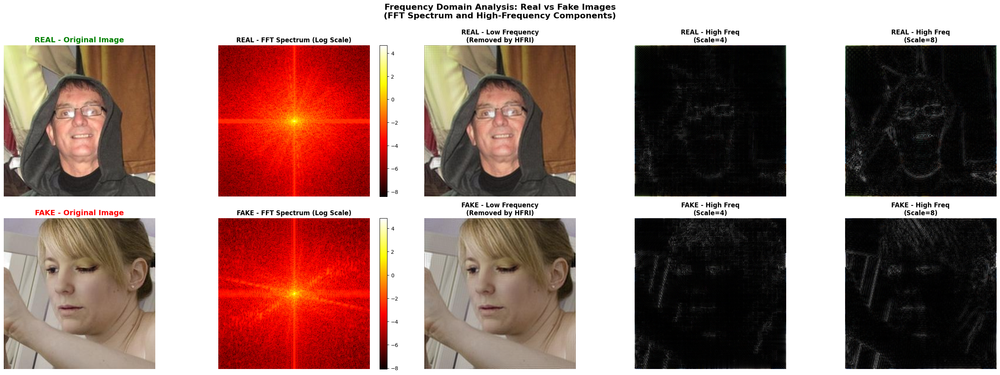

In [ ]:
def visualize_fft_spectrum_clear(img_tensor, scale=4):

    # FFT
    X = torch.fft.fft2(img_tensor, norm="ortho")
    X_shifted = torch.fft.fftshift(X, dim=(-2, -1))
    
    # Compute magnitude spectrum (log scale for better visibility)
    magnitude_spectrum = torch.abs(X_shifted)
    log_magnitude = torch.log(magnitude_spectrum + 1e-8)
    
    # Create high-freq version (mask out center)
    hfreq_shifted = X_shifted.clone()
    b, c, h, w = hfreq_shifted.shape
    dh = h // scale
    dw = w // scale
    hfreq_shifted[:, :, h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw] = 0
    
    # Create low-freq version (keep only center)
    lfreq_shifted = torch.zeros_like(X_shifted)
    lfreq_shifted[:, :, h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw] = \
        X_shifted[:, :, h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw]
    
    # Inverse FFT back to spatial domain
    hfreq_spatial = torch.fft.ifft2(torch.fft.ifftshift(hfreq_shifted, dim=(-2, -1)), norm="ortho")
    lfreq_spatial = torch.fft.ifft2(torch.fft.ifftshift(lfreq_shifted, dim=(-2, -1)), norm="ortho")
    
    # Use magnitude (more stable and visible)
    hfreq_mag = torch.sqrt(hfreq_spatial.real**2 + hfreq_spatial.imag**2 + 1e-8)
    lfreq_mag = torch.sqrt(lfreq_spatial.real**2 + lfreq_spatial.imag**2 + 1e-8)
    
    return {
        'original': img_tensor,
        'spectrum_log': log_magnitude,
        'spectrum_mag': magnitude_spectrum,
        'hfreq_mag': hfreq_mag,
        'lfreq_mag': lfreq_mag,
        'hfreq_spectrum_log': torch.log(torch.abs(hfreq_shifted) + 1e-8)
    }


def visualize_frequency_comparison(real_img_path, fake_img_path, scales=[4, 8]):
    transform_vis = T.Compose([
        T.Resize((256, 256)),
        T.ToTensor(),
    ])
    
    real_img = Image.open(real_img_path).convert('RGB')
    fake_img = Image.open(fake_img_path).convert('RGB')
    
    real_tensor = transform_vis(real_img).unsqueeze(0)
    fake_tensor = transform_vis(fake_img).unsqueeze(0)
    
    # Create figure with subplots
    n_scales = len(scales)
    fig, axes = plt.subplots(2, 3 + n_scales, figsize=(20 + 4*n_scales, 10))
    
    # Process real image
    real_data = visualize_fft_spectrum_clear(real_tensor, scale=scales[0])
    
    # Row 0: Real Image
    axes[0, 0].imshow(real_tensor[0].permute(1, 2, 0).cpu().numpy())
    axes[0, 0].set_title('REAL - Original Image', fontsize=14, fontweight='bold', color='green')
    axes[0, 0].axis('off')
    
    # FFT Spectrum (log scale, averaged across channels)
    spectrum_vis = real_data['spectrum_log'][0].mean(0).cpu().numpy()
    im1 = axes[0, 1].imshow(spectrum_vis, cmap='hot', interpolation='bilinear')
    axes[0, 1].set_title('REAL - FFT Spectrum (Log Scale)', fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046)
    
    # Low frequency component
    lfreq_vis = real_data['lfreq_mag'][0].permute(1, 2, 0).cpu().numpy()
    lfreq_vis = (lfreq_vis - lfreq_vis.min()) / (lfreq_vis.max() - lfreq_vis.min() + 1e-8)
    axes[0, 2].imshow(lfreq_vis)
    axes[0, 2].set_title('REAL - Low Frequency\n(Removed by HFRI)', fontsize=12, fontweight='bold')
    axes[0, 2].axis('off')
    
    # High frequency at different scales
    for idx, scale in enumerate(scales):
        hfreq_data = visualize_fft_spectrum_clear(real_tensor, scale=scale)
        hfreq_vis = hfreq_data['hfreq_mag'][0].permute(1, 2, 0).cpu().numpy()
        hfreq_vis = (hfreq_vis - hfreq_vis.min()) / (hfreq_vis.max() - hfreq_vis.min() + 1e-8)
        axes[0, 3 + idx].imshow(hfreq_vis, cmap='gray')
        axes[0, 3 + idx].set_title(f'REAL - High Freq\n(Scale={scale})', fontsize=12, fontweight='bold')
        axes[0, 3 + idx].axis('off')
    
    # Process fake image
    fake_data = visualize_fft_spectrum_clear(fake_tensor, scale=scales[0])
    
    # Row 1: Fake Image
    axes[1, 0].imshow(fake_tensor[0].permute(1, 2, 0).cpu().numpy())
    axes[1, 0].set_title('FAKE - Original Image', fontsize=14, fontweight='bold', color='red')
    axes[1, 0].axis('off')
    
    # FFT Spectrum (log scale)
    spectrum_vis = fake_data['spectrum_log'][0].mean(0).cpu().numpy()
    im2 = axes[1, 1].imshow(spectrum_vis, cmap='hot', interpolation='bilinear')
    axes[1, 1].set_title('FAKE - FFT Spectrum (Log Scale)', fontsize=12, fontweight='bold')
    axes[1, 1].axis('off')
    plt.colorbar(im2, ax=axes[1, 1], fraction=0.046)
    
    # Low frequency component
    lfreq_vis = fake_data['lfreq_mag'][0].permute(1, 2, 0).cpu().numpy()
    lfreq_vis = (lfreq_vis - lfreq_vis.min()) / (lfreq_vis.max() - lfreq_vis.min() + 1e-8)
    axes[1, 2].imshow(lfreq_vis)
    axes[1, 2].set_title('FAKE - Low Frequency\n(Removed by HFRI)', fontsize=12, fontweight='bold')
    axes[1, 2].axis('off')
    
    # High frequency at different scales
    for idx, scale in enumerate(scales):
        hfreq_data = visualize_fft_spectrum_clear(fake_tensor, scale=scale)
        hfreq_vis = hfreq_data['hfreq_mag'][0].permute(1, 2, 0).cpu().numpy()
        hfreq_vis = (hfreq_vis - hfreq_vis.min()) / (hfreq_vis.max() - hfreq_vis.min() + 1e-8)
        axes[1, 3 + idx].imshow(hfreq_vis, cmap='gray')
        axes[1, 3 + idx].set_title(f'FAKE - High Freq\n(Scale={scale})', fontsize=12, fontweight='bold')
        axes[1, 3 + idx].axis('off')
    
    plt.suptitle('Frequency Domain Analysis: Real vs Fake Images\n(FFT Spectrum and High-Frequency Components)', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig('frequency_analysis_clear.png', dpi=200, bbox_inches='tight')
    plt.show()


real_images = os.listdir(os.path.join(config.train_path, 'Real'))
fake_images = os.listdir(os.path.join(config.train_path, 'Fake'))

real_img_path = os.path.join(config.train_path, 'Real', real_images[0])
fake_img_path = os.path.join(config.train_path, 'Fake', fake_images[0])

print("Creating clear frequency domain visualizations...")
visualize_frequency_comparison(real_img_path, fake_img_path, scales=[4, 8])


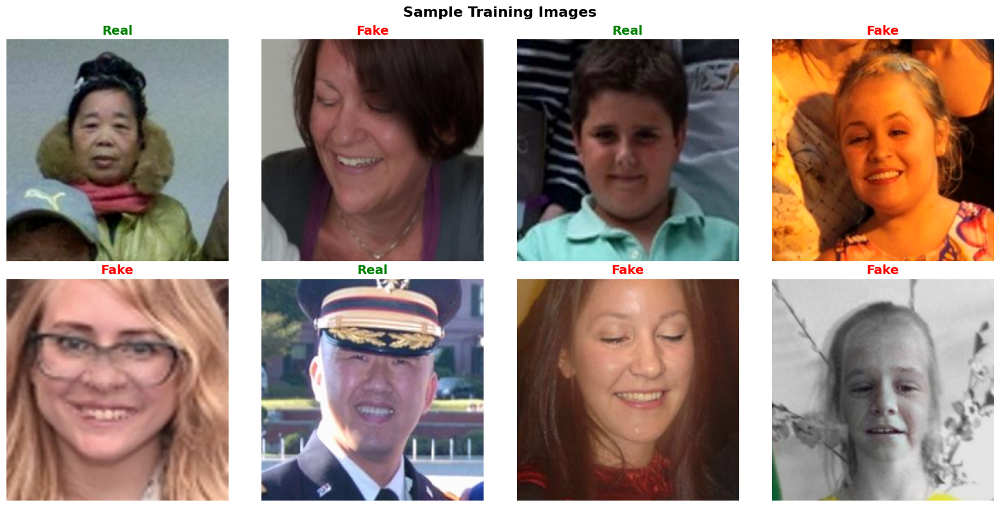

In [10]:

def show_batch(dataloader, n_images=8):
    images, labels = next(iter(dataloader))
    
    mean = torch.tensor(IMAGENET_MEAN).view(1, 3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(1, 3, 1, 1)
    images_denorm = images[:n_images] * std + mean
    images_denorm = torch.clamp(images_denorm, 0, 1)
    
    fig, axes = plt.subplots(2, n_images // 2, figsize=(16, 8))
    axes = axes.flatten()
    
    class_names = ['Fake', 'Real']
    
    for i in range(n_images):
        axes[i].imshow(images_denorm[i].permute(1, 2, 0).numpy())
        label = class_names[int(labels[i].item())]
        color = 'green' if label == 'Real' else 'red'
        axes[i].set_title(f'{label}', fontsize=14, color=color, fontweight='bold')
        axes[i].axis('off')
    
    plt.suptitle('Sample Training Images', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
    plt.show()

show_batch(train_loader)


## 6. Model Initialization and Memory Management

In [11]:

clear_memory()

model = FreqNetDetector(
    scales=config.scales,
    base_ch=config.base_ch,
    dropout=config.dropout
).to(device)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Model: FreqNetDetector")
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"\nArchitecture:")
print(f"  - Multi-scale HFRI: scales={config.scales}")
print(f"  - Base channels: {config.base_ch}")
print(f"  - Dropout: {config.dropout}")

clear_memory()
print(f"\nGPU Memory after model init:")
if torch.cuda.is_available():
    print(f"  Allocated: {torch.cuda.memory_allocated(0) / 1e9:.2f} GB")
    print(f"  Reserved: {torch.cuda.memory_reserved(0) / 1e9:.2f} GB")


Model: FreqNetDetector
Total parameters: 3,639,747
Trainable parameters: 3,639,747

Architecture:
  - Multi-scale HFRI: scales=(4, 8)
  - Base channels: 64
  - Dropout: 0.3

GPU Memory after model init:
  Allocated: 0.01 GB
  Reserved: 0.03 GB


## 5. Data Preparation


In [12]:

criterion = nn.BCEWithLogitsLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=config.learning_rate,
    weight_decay=config.weight_decay
)


scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=config.learning_rate,
    epochs=config.num_epochs,
    steps_per_epoch=len(train_loader),
    pct_start=0.1,  # 10% warmup
    anneal_strategy='cos'
)


scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())

print(f"Training Configuration:")
print(f"  - Optimizer: AdamW (lr={config.learning_rate}, weight_decay={config.weight_decay})")
print(f"  - Scheduler: CosineAnnealingLR")
print(f"  - Loss: BCEWithLogitsLoss")
print(f"  - AMP: {'Enabled' if torch.cuda.is_available() else 'Disabled'}")


Training Configuration:
  - Optimizer: AdamW (lr=0.001, weight_decay=0.0001)
  - Scheduler: CosineAnnealingLR
  - Loss: BCEWithLogitsLoss
  - AMP: Enabled


In [13]:
@torch.no_grad()
def predict_logits(model, loader, device):
    model.eval()
    all_logits, all_y = [], []
    for x, y in loader:
        x = x.to(device, non_blocking=True)
        logits = model(x)
        all_logits.append(logits.detach().cpu())
        all_y.append(y.cpu())
    return torch.cat(all_logits).numpy(), torch.cat(all_y).numpy()


def best_threshold_by_f1(y_true, probs):
    best_t, best_f1 = 0.5, -1
    for t in np.linspace(0.05, 0.95, 181):
        pred = (probs >= t).astype(np.int32)
        f1 = f1_score(y_true, pred, zero_division=0)
        if f1 > best_f1:
            best_f1, best_t = f1, t
    return float(best_t), float(best_f1)


print("Training utilities defined!")


Training utilities defined!


In [ ]:

history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_ap': [],
    'val_acc': [],
    'lr': []
}

best_ap = -1
best_state = None
best_model_path = os.path.join(config.save_dir, 'freqnet_best.pth')

print("=" * 70)
print("Starting Training")
print("=" * 70)

for epoch in range(1, config.num_epochs + 1):
    print(f"\nEpoch {epoch:02d}/{config.num_epochs}")
    print("-" * 50)
    
    model.train()
    running_loss = 0.0
    train_preds = []
    train_labels = []
    
    pbar = tqdm(train_loader, desc='Training')
    for batch_idx, (x, y) in enumerate(pbar):
        x = x.to(device, non_blocking=True)
        y = y.to(device, non_blocking=True)
        
        optimizer.zero_grad(set_to_none=True)
        
        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            logits = model(x)
            loss = criterion(logits, y)
        
        scaler.scale(loss).backward()

        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        
        scaler.step(optimizer)
        scaler.update()
        
        running_loss += loss.item() * x.size(0)
        
        # Collect predictions for train accuracy
        probs = torch.sigmoid(logits).detach().cpu().numpy()
        preds = (probs >= 0.5).astype(np.int32)
        train_preds.extend(preds)
        train_labels.extend(y.detach().cpu().numpy())

        if epoch == 1 and batch_idx < 5:
            total_norm = 0.0
            for p in model.parameters():
                if p.grad is not None:
                    total_norm += p.grad.data.norm(2).item() ** 2
            total_norm = total_norm ** 0.5
            if batch_idx == 0:
                print(f"  Batch {batch_idx}: loss={loss.item():.4f}, grad_norm={total_norm:.4f}")
        
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

        if (batch_idx + 1) % 50 == 0:
            clear_memory()

        scheduler.step()
    train_loss = running_loss / len(train_loader.dataset)
    train_acc = accuracy_score(train_labels, train_preds)
    current_lr = optimizer.param_groups[0]['lr']

    clear_memory()

    val_logits, val_y = predict_logits(model, val_loader, device)
    val_probs = 1 / (1 + np.exp(-val_logits))
    val_loss = criterion(torch.tensor(val_logits), torch.tensor(val_y)).item()
    val_ap = average_precision_score(val_y, val_probs)
    val_pred = (val_probs >= 0.5).astype(np.int32)
    val_acc = accuracy_score(val_y, val_pred)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_ap'].append(val_ap)
    history['val_acc'].append(val_acc)
    history['lr'].append(current_lr)
    
    print(f"Train Loss: {train_loss:.4f} | Val AP: {val_ap:.4f} | Val Acc: {val_acc:.4f}")
    print(f"Learning Rate: {current_lr:.6f}")

    if val_ap > best_ap:
        best_ap = val_ap
        best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
        torch.save(best_state, best_model_path)
        print(f"✓ Saved new best model with Val AP: {val_ap:.4f}")

    clear_memory()

print("\n" + "=" * 70)
print(f"Training Complete! Best Val AP: {best_ap:.4f}")
print("=" * 70)


Starting Training

Epoch 01/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

  Batch 0: loss=0.6990, grad_norm=1.0000
Train Loss: 0.6556 | Val AP: 0.6885 | Val Acc: 0.6305
Learning Rate: 0.000520
✓ Saved new best model with Val AP: 0.6885

Epoch 02/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.6470 | Val AP: 0.8102 | Val Acc: 0.7209
Learning Rate: 0.001000
✓ Saved new best model with Val AP: 0.8102

Epoch 03/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.6044 | Val AP: 0.7073 | Val Acc: 0.5771
Learning Rate: 0.000992

Epoch 04/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.5230 | Val AP: 0.8699 | Val Acc: 0.7424
Learning Rate: 0.000970
✓ Saved new best model with Val AP: 0.8699

Epoch 05/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.4155 | Val AP: 0.9080 | Val Acc: 0.8219
Learning Rate: 0.000933
✓ Saved new best model with Val AP: 0.9080

Epoch 06/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.3340 | Val AP: 0.8987 | Val Acc: 0.7955
Learning Rate: 0.000883

Epoch 07/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.2859 | Val AP: 0.9388 | Val Acc: 0.8260
Learning Rate: 0.000821
✓ Saved new best model with Val AP: 0.9388

Epoch 08/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.2523 | Val AP: 0.9261 | Val Acc: 0.7942
Learning Rate: 0.000750

Epoch 09/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.2232 | Val AP: 0.9514 | Val Acc: 0.8669
Learning Rate: 0.000671
✓ Saved new best model with Val AP: 0.9514

Epoch 10/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.2058 | Val AP: 0.9613 | Val Acc: 0.9037
Learning Rate: 0.000587
✓ Saved new best model with Val AP: 0.9613

Epoch 11/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1938 | Val AP: 0.9574 | Val Acc: 0.8810
Learning Rate: 0.000500

Epoch 12/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1704 | Val AP: 0.9682 | Val Acc: 0.8945
Learning Rate: 0.000413
✓ Saved new best model with Val AP: 0.9682

Epoch 13/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1576 | Val AP: 0.9729 | Val Acc: 0.9092
Learning Rate: 0.000329
✓ Saved new best model with Val AP: 0.9729

Epoch 14/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1434 | Val AP: 0.9765 | Val Acc: 0.9182
Learning Rate: 0.000250
✓ Saved new best model with Val AP: 0.9765

Epoch 15/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1335 | Val AP: 0.9745 | Val Acc: 0.9077
Learning Rate: 0.000179

Epoch 16/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1209 | Val AP: 0.9745 | Val Acc: 0.9099
Learning Rate: 0.000117

Epoch 17/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1177 | Val AP: 0.9796 | Val Acc: 0.9228
Learning Rate: 0.000067
✓ Saved new best model with Val AP: 0.9796

Epoch 18/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1052 | Val AP: 0.9802 | Val Acc: 0.9232
Learning Rate: 0.000030
✓ Saved new best model with Val AP: 0.9802

Epoch 19/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.1000 | Val AP: 0.9800 | Val Acc: 0.9224
Learning Rate: 0.000008

Epoch 20/20
--------------------------------------------------


Training:   0%|          | 0/1125 [00:00<?, ?it/s]

Train Loss: 0.0993 | Val AP: 0.9785 | Val Acc: 0.9182
Learning Rate: 0.000000

Training Complete! Best Val AP: 0.9802


## 7. Training Curves Visualization


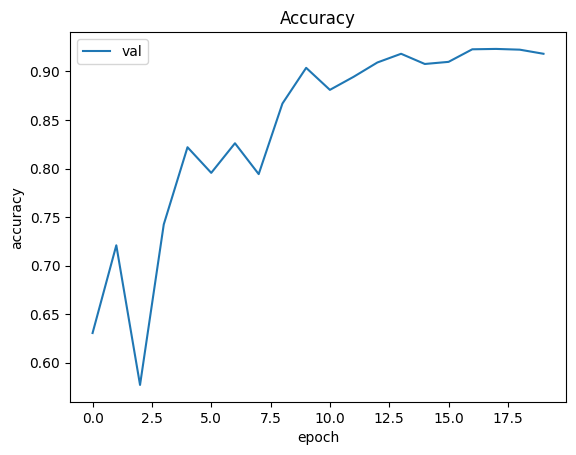

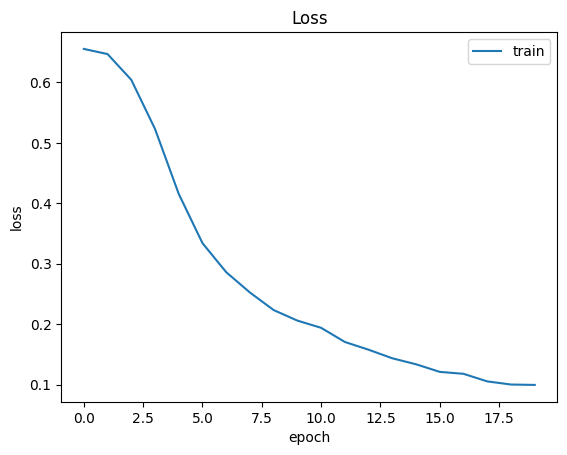

In [24]:
def plot_training_curves(history):
    epochs = range(len(history['train_loss']))
    
    # Accuracy plot
    plt.figure()
    labels = []
    if 'train_acc' in history:
        plt.plot(history['train_acc'])
        labels.append("train")
    if 'val_acc' in history:
        plt.plot(history['val_acc'])
        labels.append("val")
    plt.title("Accuracy")
    plt.xlabel("epoch")
    plt.ylabel("accuracy")
    if labels:
        plt.legend(labels)
    plt.show()
    
    # Loss plot
    plt.figure()
    labels = []
    if 'train_loss' in history:
        plt.plot(history['train_loss'])
        labels.append("train")
    if 'val_loss' in history:
        plt.plot(history['val_loss'])
        labels.append("val")
    plt.title("Loss")
    plt.xlabel("epoch")
    plt.ylabel("loss")
    if labels:
        plt.legend(labels)
    plt.show()

plot_training_curves(history)


In [16]:

model.load_state_dict(torch.load(best_model_path))
model.to(device)
model.eval()
print(f"Loaded best model from: {best_model_path}")

val_logits, val_y = predict_logits(model, val_loader, device)
val_probs = 1 / (1 + np.exp(-val_logits))
optimal_threshold, best_val_f1 = best_threshold_by_f1(val_y, val_probs)

print(f"\nOptimal threshold (from validation set): {optimal_threshold:.3f}")
print(f"Best F1 on validation set: {best_val_f1:.4f}")


Loaded best model from: ./checkpoints\freqnet_best.pth

Optimal threshold (from validation set): 0.450
Best F1 on validation set: 0.9245


## 8. Model Evaluation on Test Set


In [17]:
test_logits, test_y = predict_logits(model, test_loader, device)
test_probs = 1 / (1 + np.exp(-test_logits))
test_pred = (test_probs >= optimal_threshold).astype(np.int32)

test_loss = criterion(torch.tensor(test_logits), torch.tensor(test_y)).item()
test_acc = accuracy_score(test_y, test_pred)
test_precision = precision_score(test_y, test_pred, zero_division=0)
test_recall = recall_score(test_y, test_pred, zero_division=0)
test_f1 = f1_score(test_y, test_pred, zero_division=0)
test_ap = average_precision_score(test_y, test_probs)
test_roc_auc = roc_auc_score(test_y, test_probs)

fake_mask = test_y == 0
real_mask = test_y == 1
fake_acc = accuracy_score(test_y[fake_mask], test_pred[fake_mask]) if fake_mask.sum() > 0 else 0
real_acc = accuracy_score(test_y[real_mask], test_pred[real_mask]) if real_mask.sum() > 0 else 0

print("=" * 70)
print("TEST SET EVALUATION RESULTS")
print("=" * 70)
print(f"\nUsing threshold: {optimal_threshold:.3f} (optimized on validation set)")
print(f"\nOverall Metrics:")
print(f"  Test Loss:         {test_loss:.4f}")
print(f"  Accuracy:          {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"  Precision:         {test_precision:.4f}")
print(f"  Recall:            {test_recall:.4f}")
print(f"  F1-Score:          {test_f1:.4f}")
print(f"  Average Precision: {test_ap:.4f}")
print(f"  ROC-AUC:           {test_roc_auc:.4f}")
print(f"\nPer-Class Accuracy:")
print(f"  Fake Images:       {fake_acc:.4f} ({fake_acc*100:.2f}%)")
print(f"  Real Images:       {real_acc:.4f} ({real_acc*100:.2f}%)")
print("=" * 70)

print("\nDetailed Classification Report:")
print(classification_report(test_y, test_pred, target_names=['Fake', 'Real']))


TEST SET EVALUATION RESULTS

Using threshold: 0.450 (optimized on validation set)

Overall Metrics:
  Test Loss:         0.5176
  Accuracy:          0.8331 (83.31%)
  Precision:         0.8707
  Recall:            0.7825
  F1-Score:          0.8242
  Average Precision: 0.9164
  ROC-AUC:           0.9167

Per-Class Accuracy:
  Fake Images:       0.8838 (88.38%)
  Real Images:       0.7825 (78.25%)

Detailed Classification Report:
              precision    recall  f1-score   support

        Fake       0.80      0.88      0.84      3200
        Real       0.87      0.78      0.82      3200

    accuracy                           0.83      6400
   macro avg       0.84      0.83      0.83      6400
weighted avg       0.84      0.83      0.83      6400



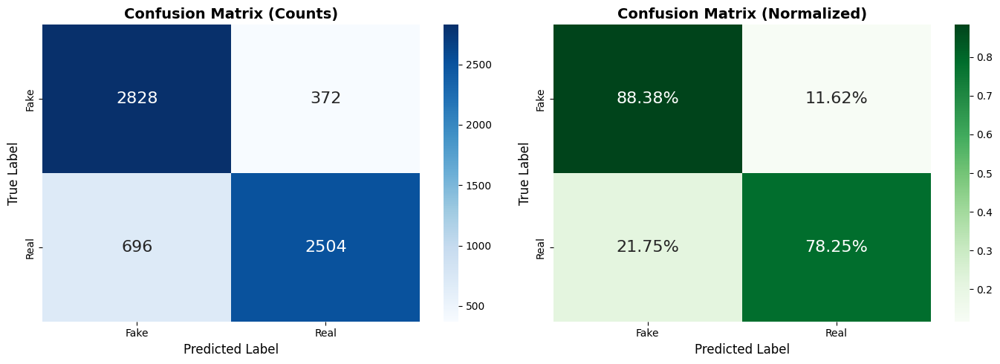

In [18]:
def plot_confusion_matrix(y_true, y_pred, class_names=['Fake', 'Real']):
    cm = confusion_matrix(y_true, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Raw counts
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                ax=axes[0], annot_kws={'size': 16})
    axes[0].set_xlabel('Predicted Label', fontsize=12)
    axes[0].set_ylabel('True Label', fontsize=12)
    axes[0].set_title('Confusion Matrix (Counts)', fontsize=14, fontweight='bold')
    
    # Normalized
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Greens',
                xticklabels=class_names, yticklabels=class_names,
                ax=axes[1], annot_kws={'size': 16})
    axes[1].set_xlabel('Predicted Label', fontsize=12)
    axes[1].set_ylabel('True Label', fontsize=12)
    axes[1].set_title('Confusion Matrix (Normalized)', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    return cm

cm = plot_confusion_matrix(test_y, test_pred)


## 11. Prediction Visualization


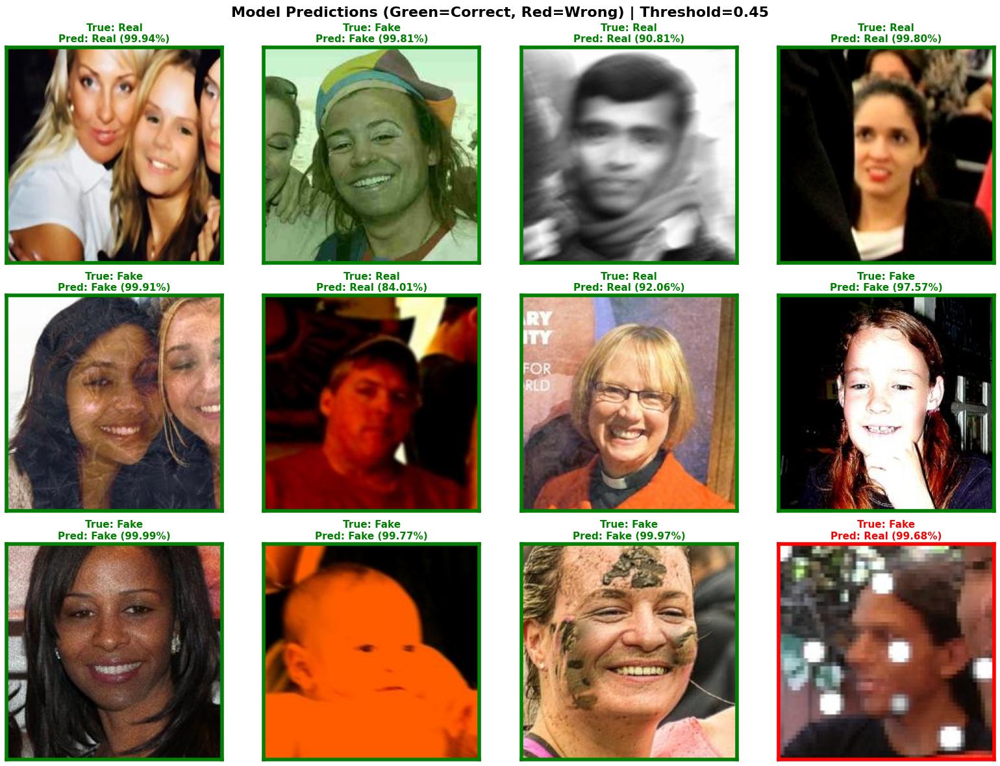

In [19]:
def visualize_predictions(dataloader, model, device, threshold, n_samples=12):
    model.eval()
    
    # Collect samples
    all_images, all_labels, all_probs = [], [], []
    with torch.no_grad():
        for images, labels in dataloader:
            images_gpu = images.to(device)
            logits = model(images_gpu)
            probs = torch.sigmoid(logits).cpu().numpy()
            all_images.extend(images)
            all_labels.extend(labels.numpy())
            all_probs.extend(probs)
            if len(all_images) >= n_samples * 4:
                break

    indices = np.random.choice(len(all_images), min(n_samples, len(all_images)), replace=False)
    
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    
    n_cols = 4
    n_rows = (n_samples + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
    axes = axes.flatten()
    
    class_names = ['Fake', 'Real']
    
    for i, idx in enumerate(indices):
        img = all_images[idx] * std + mean
        img = torch.clamp(img, 0, 1)
        
        true_label = class_names[int(all_labels[idx])]
        prob = all_probs[idx]
        pred_label = class_names[1 if prob >= threshold else 0]
        confidence = prob if prob >= threshold else 1 - prob
        
        is_correct = true_label == pred_label
        border_color = 'green' if is_correct else 'red'
        
        axes[i].imshow(img.permute(1, 2, 0).numpy())
        
        title = f"True: {true_label}\nPred: {pred_label} ({confidence:.2%})"
        axes[i].set_title(title, fontsize=11, color=border_color, fontweight='bold')
        
        for spine in axes[i].spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(4)
        
        axes[i].set_xticks([])
        axes[i].set_yticks([])
    
    for i in range(len(indices), len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(f'Model Predictions (Green=Correct, Red=Wrong) | Threshold={threshold:.2f}',
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig('predictions_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_predictions(test_loader, model, device, optimal_threshold, n_samples=12)


Found 17 misclassified samples


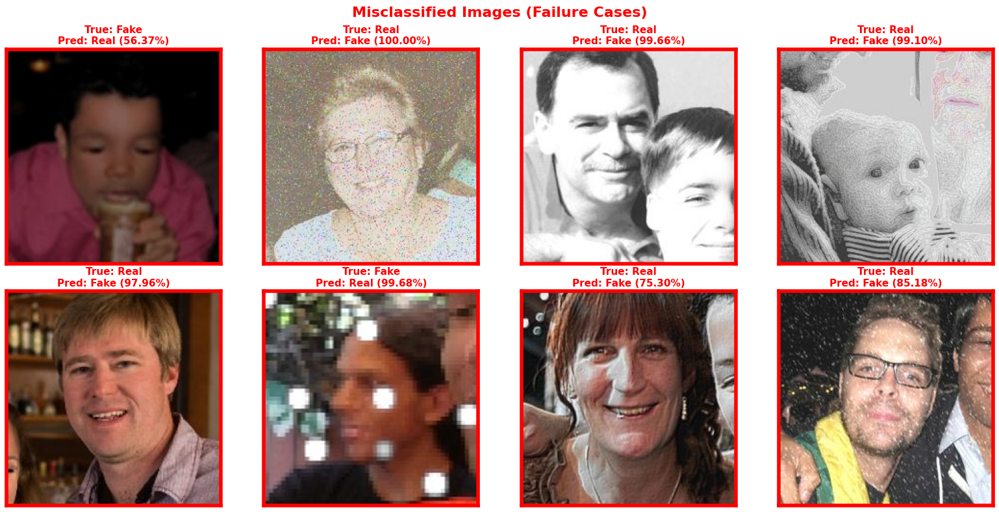

In [20]:
def visualize_failure_cases(dataloader, model, device, threshold, n_samples=8):
    model.eval()
    
    # Collect samples
    wrong_images, wrong_labels, wrong_probs = [], [], []
    with torch.no_grad():
        for images, labels in dataloader:
            images_gpu = images.to(device)
            logits = model(images_gpu)
            probs = torch.sigmoid(logits).cpu().numpy()
            preds = (probs >= threshold).astype(int)
            
            for img, lbl, prob, pred in zip(images, labels.numpy(), probs, preds):
                if int(lbl) != pred:
                    wrong_images.append(img)
                    wrong_labels.append(lbl)
                    wrong_probs.append(prob)
            
            if len(wrong_images) >= n_samples * 2:
                break
    
    if len(wrong_images) == 0:
        print("No misclassified samples found!")
        return
    
    print(f"Found {len(wrong_images)} misclassified samples")
    
    # Denormalize
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    
    n_samples = min(n_samples, len(wrong_images))
    indices = np.random.choice(len(wrong_images), n_samples, replace=False)
    
    n_cols = 4
    n_rows = (n_samples + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
    if n_rows == 1:
        axes = [axes]
    axes = np.array(axes).flatten()
    
    class_names = ['Fake', 'Real']
    
    for i, idx in enumerate(indices):
        img = wrong_images[idx] * std + mean
        img = torch.clamp(img, 0, 1)
        
        true_label = class_names[int(wrong_labels[idx])]
        prob = wrong_probs[idx]
        pred_label = class_names[1 if prob >= threshold else 0]
        confidence = prob if prob >= threshold else 1 - prob
        
        axes[i].imshow(img.permute(1, 2, 0).numpy())
        
        title = f"True: {true_label}\nPred: {pred_label} ({confidence:.2%})"
        axes[i].set_title(title, fontsize=11, color='red', fontweight='bold')
        
        for spine in axes[i].spines.values():
            spine.set_edgecolor('red')
            spine.set_linewidth(4)
        
        axes[i].set_xticks([])
        axes[i].set_yticks([])
    
    for i in range(n_samples, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle('Misclassified Images (Failure Cases)', fontsize=16, fontweight='bold', color='red')
    plt.tight_layout()
    plt.savefig('failure_cases.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_failure_cases(test_loader, model, device, optimal_threshold, n_samples=8)


## 12. High-Frequency Analysis of Predictions


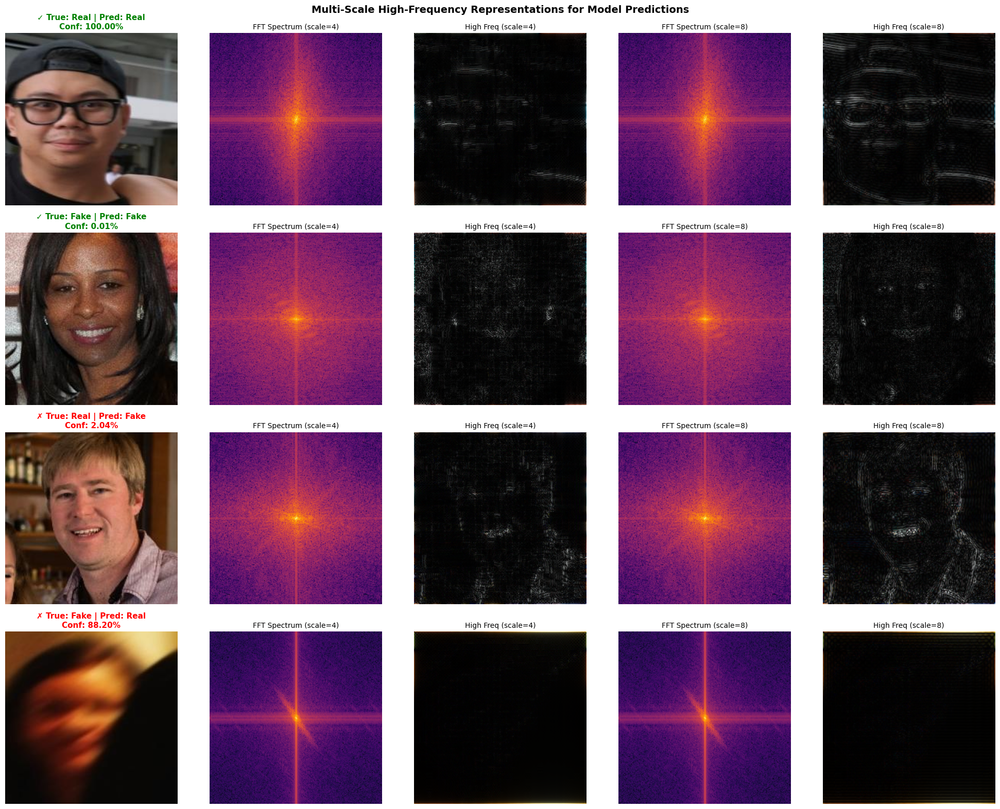

In [21]:
def compute_hfreq_representation(img_tensor, scale=4):
    # FFT
    X = torch.fft.fft2(img_tensor, norm="ortho")
    X_shifted = torch.fft.fftshift(X, dim=(-2, -1))
    
    # Create high-freq version (mask out center)
    hfreq = X_shifted.clone()
    b, c, h, w = hfreq.shape
    dh = h // scale
    dw = w // scale
    hfreq[:, :, h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw] = 0
    
    # Create low-freq version (keep only center)
    lfreq = torch.zeros_like(X_shifted)
    lfreq[:, :, h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw] = \
        X_shifted[:, :, h//2 - dh:h//2 + dh, w//2 - dw:w//2 + dw]
    
    # Inverse FFT back to spatial
    hfreq_spatial = torch.fft.ifft2(torch.fft.ifftshift(hfreq, dim=(-2, -1)), norm="ortho")
    lfreq_spatial = torch.fft.ifft2(torch.fft.ifftshift(lfreq, dim=(-2, -1)), norm="ortho")
    
    # Use magnitude (more stable)
    hfreq_mag = torch.sqrt(hfreq_spatial.real**2 + hfreq_spatial.imag**2 + 1e-8)
    lfreq_mag = torch.sqrt(lfreq_spatial.real**2 + lfreq_spatial.imag**2 + 1e-8)
    
    # Spectrum magnitude (log) for visualization
    spectrum = torch.log(torch.abs(X_shifted) + 1e-8)
    
    return spectrum, hfreq_mag, lfreq_mag


def visualize_hfreq_predictions(dataloader, model, device, threshold):
    model.eval()
    
    samples = {'real_correct': [], 'fake_correct': [], 'real_wrong': [], 'fake_wrong': []}
    
    with torch.no_grad():
        for images, labels in dataloader:
            images_gpu = images.to(device)
            logits = model(images_gpu)
            probs = torch.sigmoid(logits).cpu().numpy()
            preds = (probs >= threshold).astype(int)
            
            for img, lbl, prob, pred in zip(images, labels.numpy(), probs, preds):
                key = ('real' if lbl == 1 else 'fake') + '_' + ('correct' if int(lbl) == pred else 'wrong')
                if len(samples[key]) < 1:
                    samples[key].append((img, lbl, prob))
            
            if all(len(v) >= 1 for v in samples.values()):
                break
    
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    
    selected = []
    for key in ['real_correct', 'fake_correct', 'real_wrong', 'fake_wrong']:
        if samples[key]:
            selected.append(samples[key][0])
    
    if not selected:
        print("No samples found!")
        return
    
    fig, axes = plt.subplots(len(selected), 5, figsize=(20, 4 * len(selected)))
    if len(selected) == 1:
        axes = axes.reshape(1, -1)
    
    class_names = ['Fake', 'Real']
    
    for i, (img, lbl, prob) in enumerate(selected):
        img_denorm = img * std + mean
        img_denorm = torch.clamp(img_denorm, 0, 1)
        
        true_label = class_names[int(lbl)]
        pred_label = class_names[1 if prob >= threshold else 0]
        is_correct = true_label == pred_label
        color = 'green' if is_correct else 'red'
        status = '✓' if is_correct else '✗'
        
        # Original image
        axes[i, 0].imshow(img_denorm.permute(1, 2, 0).numpy())
        axes[i, 0].set_title(f'{status} True: {true_label} | Pred: {pred_label}\nConf: {prob:.2%}',
                            fontsize=11, color=color, fontweight='bold')
        
        # Multi-scale high-frequency
        img_batch = img.unsqueeze(0)
        for j, scale in enumerate([4, 8]):
            spectrum, hfreq, _ = compute_hfreq_representation(img_batch, scale=scale)
            
            axes[i, 1 + j*2].imshow(spectrum[0].mean(0).cpu().numpy(), cmap='inferno')
            axes[i, 1 + j*2].set_title(f'FFT Spectrum (scale={scale})', fontsize=10)
            
            hfreq_vis = (hfreq[0] - hfreq[0].min()) / (hfreq[0].max() - hfreq[0].min() + 1e-8)
            axes[i, 2 + j*2].imshow(hfreq_vis.permute(1, 2, 0).cpu().numpy())
            axes[i, 2 + j*2].set_title(f'High Freq (scale={scale})', fontsize=10)
    
    for ax in axes.flatten():
        ax.axis('off')
    
    plt.suptitle('Multi-Scale High-Frequency Representations for Model Predictions',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('hfreq_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_hfreq_predictions(test_loader, model, device, optimal_threshold)
